In [1]:
import os
os.chdir('/Users/Sinead/DC-project/')
import matplotlib
import matplotlib.pyplot as plt
plt.ioff()
import numpy as np
import script
%matplotlib inline
import plotly 
plotly.offline.init_notebook_mode()
import find_eyes_reshape as fer
import nibabel as nib
import vtk

/Users/Sinead/anaconda/envs/project/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [1]:
PathDicoms = np.array(
    [['/Volumes/Backup Data/ASDH Samples/Sample1/Post-operative/R-N11-109/HeadSpi  1.0  J40s  3', 'Sample 1'],
     ['/Volumes/Backup Data/ASDH Samples/Sample2/Original/Post-op.nii', 'Sample 2'],
     ['/Volumes/Backup Data/ASDH Samples/Sample3/Post-op', 'Sample 3'],
     ['/Volumes/Backup Data/ASDH Samples/Sample4/Post-op', 'Sample 4'],
     ['/Volumes/Backup Data/ASDH Samples/Sample5/Post-op', 'Sample 5'],
     ['/Volumes/Backup Data/ASDH Samples/SampleA/Post-op', 'Sample A'],
     ['/Volumes/Backup Data/ASDH Samples/SampleB/Post-op', 'Sample B'],
     ['/Volumes/Backup Data/ASDH Samples/SampleC/Post-op', 'Sample C'],
     ['/Volumes/Backup Data/ASDH Samples/SampleD/Post-op', 'Sample D'],
     ['/Volumes/Backup Data/ASDH Samples/SampleF/Post-op', 'Sample F'],
     ['/Volumes/Backup Data/ASDH Samples/SampleG/Post-op', 'Sample G'],
     ['/Volumes/Backup Data/ASDH Samples/SampleH/Post-op', 'Sample H'],
     ['/Volumes/Backup Data/ASDH Samples/SampleI/Post-op', 'Sample I']])

NameError: name 'np' is not defined

In [161]:
PathDicom = PathDicoms[3][0]
samp = PathDicoms[3][1]
print samp

Sample 4


In [162]:
# threshold CT scan for eyes and bone and store in 2 different arrays
reload(script)
if PathDicom.endswith('.nii'):
    thresholded_bone=script.threshim_nii(1100,1500)
    array_bone, ConstPixelSpacing = script.vtk2np_nii(thresholded_bone)
    thresholded_eyes = script.threshim_nii(0,80) # remove soft tissue
    array_eyes, ConstPixelSpacing = script.vtk2np_nii(thresholded_eyes)
    thresholded_visual=script.threshim_nii(-100,1500) 
    array_visual, ConstPixelSpacing = script.vtk2np_nii(thresholded_visual) 
else:
    thresholded_bone=script.threshim_dicom(1100,1500)
    array_bone, ConstPixelSpacing = script.vtk2np(thresholded_bone)
    thresholded_eyes = script.threshim_dicom(0,80) # remove soft tissue
    array_eyes, ConstPixelSpacing = script.vtk2np(thresholded_eyes)
    thresholded_visual=script.threshim_dicom(-100,1500) 
    array_visual, ConstPixelSpacing = script.vtk2np(thresholded_visual) 

In [163]:
# reshape the arrays - don't run this twice
array_bone = script.reshape(array_bone, ConstPixelSpacing, 220, 160, array_bone.shape[0], array_bone.shape[2])
array_eyes = script.reshape(array_eyes, ConstPixelSpacing, 220, 160, array_eyes.shape[0], array_eyes.shape[2])
array_visual = script.reshape(array_visual, ConstPixelSpacing, 220, 160, array_visual.shape[0], array_visual.shape[2])

In [164]:
# # sample the array so everything takes less time
# sampled_array_bone = array_bone[0:-1:2, 0:-1:2,0:-1:2]
# sampled_array_eyes = array_eyes[0:-1:2, 0:-1:2,0:-1:2]
# sampled_array_visual = array_visual[0:-1:2, 0:-1:2,0:-1:2]

In [165]:
H, edges, data, hist_data_2c = fer.hist3d_all(array_eyes)

In [166]:
ranges_1, ranges_2, certainty = fer.ranges(H,edges)
c1,c2 = fer.coords(hist_data_2c, ranges_1, ranges_2)
# fer.check_coords(c1,c2,array_eyes)

Optimization terminated successfully.
         Current function value: -23.256401
         Iterations: 41
         Function evaluations: 82


In [167]:
angle1, angle2 = fer.angles_from_eyes(c1,c2)
array_bone1, array_bone2 = fer.correct_skews(angle1,angle2,array_bone)
array_eyes1, array_eyes2 = fer.correct_skews(angle1,angle2,array_eyes)
array_visual1, array_visual2 = fer.correct_skews(angle1,angle2,array_visual)

# angle1, angle2 = fer.angles_from_eyes(c1,c2)
# s_array_bone1, s_array_bone2 = fer.correct_skews(angle1,angle2,sampled_array_bone)
# s_array_eyes1, s_array_eyes2 = fer.correct_skews(angle1,angle2,sampled_array_eyes)
# s_array_visual1, s_array_visual2 = fer.correct_skews(angle1,angle2,sampled_array_visual)

In [168]:
# H, edges, data, hist_data_2c = fer.hist3d_all(array_eyes2)
# ranges_1, ranges_2, certainty = fer.ranges(H,edges)
# c1,c2 = fer.coords(hist_data_2c, ranges_1, ranges_2)

In [169]:
# fer.check_coords(c1,c2,array_eyes2)

In [170]:
reload(script)
angles, xcentroids, ycentroids, xmajor_axis_points, ymajor_axis_points = script.ellipses(array_bone2)

Starting ellipse fitting
Slice number 0
Slice number 1
Slice number 2
Slice number 3
Slice number 4
Slice number 5
Slice number 6
Slice number 7
Slice number 8
Slice number 9
Slice number 10
Slice number 11
Slice number 12
Slice number 13
Slice number 14
Slice number 15
Slice number 16
Slice number 17
Slice number 18
Slice number 19
Slice number 20
Slice number 21
Slice number 22
Slice number 23
Slice number 24
Slice number 25
Slice number 26
Slice number 27
Slice number 28
Slice number 29
Slice number 30
Slice number 31
Slice number 32
Slice number 33
Slice number 34
Slice number 35
Slice number 36
Slice number 37
Slice number 38
Slice number 39
Slice number 40
Slice number 41
Slice number 42
Slice number 43
Slice number 44
Slice number 45
Slice number 46
Slice number 47
Slice number 48
Slice number 49
Slice number 50
Slice number 51
Slice number 52
Slice number 53
Slice number 54
Slice number 55
Slice number 56
Slice number 57
Slice number 58
Slice number 59
Slice number 60
Slice num

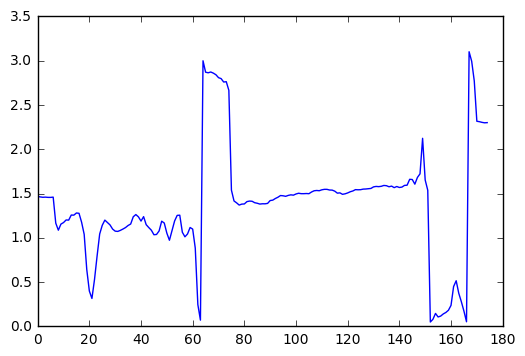

In [171]:
reload(script)
slices, slice_angles = script.select_ellipses_range(angles)
plt.plot(angles)
plt.show()

In [172]:
# # one vector of plane, v1
# v1 = np.array([0, 0, 1])
# # second vector of plane, v2
# v2 = np.array([np.cos(np.pi), np.sin(np.pi), 0])

In [173]:
head_angles = slice_angles
head_x = [xcentroids[i] for i in slices] 
head_y = [ycentroids[i] for i in slices] 

In [189]:
reload(script)
a,b,c,d = script.find_plane_from_ellipses(array_bone2,array_eyes2, slices, head_x, head_y, head_angles)

script.py:140: SyntaxWarning:

import * only allowed at module level



Optimization terminated successfully.
         Current function value: -23.377076
         Iterations: 41
         Function evaluations: 82
[ 126.06102137  115.58858094  118.        ]


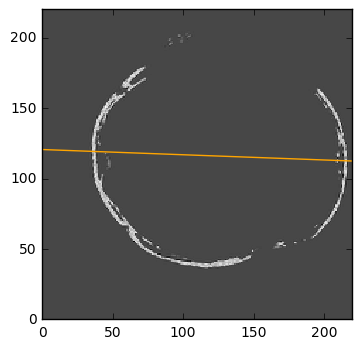

In [190]:
from matplotlib.colors import LinearSegmentedColormap
import pylab
cmap1 = LinearSegmentedColormap.from_list("my_colormap", ((0,0,0),(0.2, 0.2, 0.2),(0.3, 0.3, 0.3), (0.4, 0.4, 0.4),(0.5, 0.5, 0.5), (0.6,0.6,0.6),(0.7, 0.7, 0.7), (0.8, 0.8, 0.8), (0.9, 0.9, 0.9),(0.8, 0.8, 0.8),(0.7, 0.7, 0.7),(0.8, 0.8, 0.8),(0.9, 0.9, 0.9),(1,1,1)), N=256, gamma=1.0)
slice_no = 106
slice_ = array_bone2[:,:,slice_no]
plt.clf()
plt.imshow(slice_, cmap=cmap1, interpolation='nearest')
# plt.scatter(c_1,c_0)
# plt.scatter(p[1], p[0])
# plt.plot([  65.23571429   78.18660714  201.40803571])
x = np.linspace(0,slice_.shape[0], 2)
y = (d-c*slice_no-a*x)/b
plt.xlim([0,array_visual.shape[0]])
plt.ylim([0,array_visual.shape[1]])
plt.plot(x,y, color='orange')
plt.show()

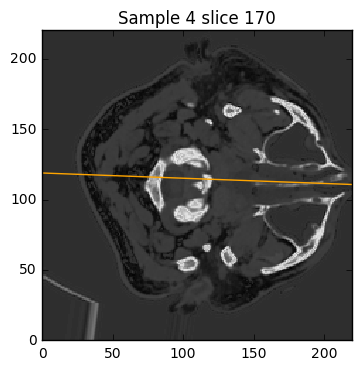

In [191]:
from matplotlib.colors import LinearSegmentedColormap
import pylab
cmap1 = LinearSegmentedColormap.from_list("my_colormap", ((0,0,0),(0.2, 0.2, 0.2),(0.3, 0.3, 0.3), (0.4, 0.4, 0.4),(0.5, 0.5, 0.5), (0.6,0.6,0.6),(0.7, 0.7, 0.7), (0.8, 0.8, 0.8), (0.9, 0.9, 0.9),(0.8, 0.8, 0.8),(0.7, 0.7, 0.7),(0.8, 0.8, 0.8),(0.9, 0.9, 0.9),(1,1,1)), N=256, gamma=1.0)

for slice_no in range(0,array_bone2.shape[2],5):
    slice_ = array_visual2[:,:,slice_no]
    plt.clf()
    plt.imshow(slice_, cmap=cmap1, interpolation='nearest')

    plt.xlim([0,array_visual.shape[0]])
    plt.ylim([0,array_visual.shape[1]])
    x = np.linspace(0,slice_.shape[0], 2)
    y = (d-c*slice_no-a*x)/b
    plt.plot(x,y, color='orange')
    plt.title('{} slice {}'.format(samp, slice_no))
    pylab.savefig('{}_slice_{}.png'.format(samp, slice_no))

In [89]:
script.visualise_single(array_eyes2, a,b,c,d, 100)

In [228]:
reload(script)
script.save_midplane(array_visual, a,b,c,d)

script.py:141: SyntaxWarning:

import * only allowed at module level



<IPython.core.display.Javascript object>


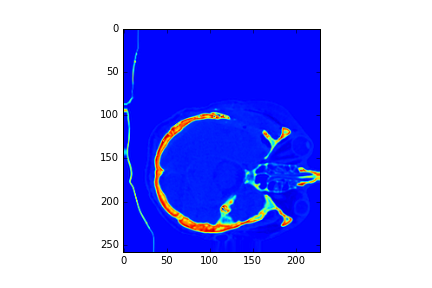

<IPython.core.display.Javascript object>


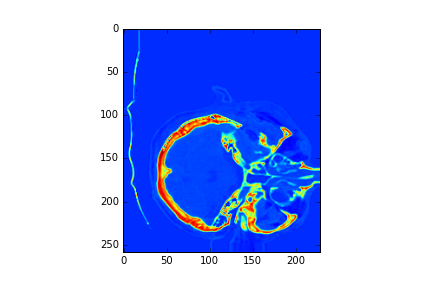

In [155]:
plt.ion()
%matplotlib nbagg
# if slices == ['use eyes']:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(array_visual[:,:,len(array_visual)/2])

coords1 = []

def onclick(event):
    global ix, iy
    ix, iy = event.xdata, event.ydata
    print 'x = %d, y = %d'%(
        ix, iy)

    global coords1
    coords1.append((ix, iy))

    if len(coords1) == 2:
        fig.canvas.mpl_disconnect(cid)

    return None
cid = fig.canvas.mpl_connect('button_press_event', onclick)

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.imshow(array_visual[:,:,len(array_visual)/2+10])

coords2 = []

def onclick(event):
    global ix, iy
    ix, iy = event.xdata, event.ydata
    print 'x = %d, y = %d'%(
        ix, iy)

    global coords2
    coords2.append((ix, iy))

    if len(coords2) == 2:
        fig.canvas.mpl_disconnect(cid)

    return None
cid = fig.canvas.mpl_connect('button_press_event', onclick)